## Import libraries

In [1]:
# the library versions this code employed is mentioned in comments, if something doesn't work change your package versions
# to these ones, especially sklearn

import pandas as pd # version 0.24.2
import numpy as np #version 1.16.4
import random
import matplotlib.pyplot as plt #matplotlib version 3.1.0
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVC
import sklearn.ensemble
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sns #version 0.9.0
from sklearn.model_selection import GridSearchCV
import pickle
import shap

In [2]:
import sklearn
print(sklearn.__version__) # this code works with sklearn 0.21.2
#i'm using 0.22.1 (it's working as well)

0.22.1


in rahil and sina's thesis there are several steps to divide the dataset (for instance the percentage of each mvoement and divide equally inside each class...); all these steps have been summarized in the following function. running Load datast it's returning X_train, y_train, X_test, y_test.
these are lists of 11 patients. each patient is a dataframe of (N, 90), with all 3 rounds and 90 features. N depends on the overall length of the experiment that is slightly different for each patient

In [3]:
from load_data import load_dataset
X_train, y_train, X_test, y_test=load_dataset()
print("number of patient: ", len(X_train))

LOAD DATASETS

:
Subject1
Round1 (2887, 152)
Round2 (2775, 152)
round3 (2498, 152)
       MAV1      MAV2      MAV3      MAV4      MAV5      MAV6      MAV7  \
0  0.020667  0.009256  0.007302  0.010696  0.048411  0.015565  0.013566   
1  0.020849  0.013591  0.014533  0.067708  0.104390  0.021633  0.026315   
2  0.013649  0.086738  0.025212  0.034016  0.042743  0.039416  0.018589   
3  0.010048  0.005960  0.006307  0.043353  0.066057  0.012944  0.024288   
4  0.072935  0.026458  0.024038  0.086573  0.157180  0.052219  0.029555   

       MAV8      MAV9     MAV10  ...    SKEW3     SKEW4    SKEW5    SKEW6  \
0  0.019455  0.019438  0.020109  ... -0.76883 -0.025066  0.76225 -0.42704   
1  0.044802  0.076000  0.008759  ...  0.17702  0.163200  0.22069  0.14271   
2  0.047252  0.061444  0.012353  ... -0.19943 -0.151700 -1.06920  0.16618   
3  0.030835  0.047647  0.006491  ...  0.19418  0.007295  0.13828  0.37693   
4  0.027389  0.231640  0.062172  ... -0.49456 -0.141540  0.10471  0.28199   

   

In [4]:
N_Subj = 11
for i in range(N_Subj) :
    print("number of instances patient ["+str(i+1)+"] :")
    print("training set"+str(X_train[i].shape))
    print("test set"+str(X_test[i].shape))

number of instances patient [1] :
training set(4398, 90)
test set(3297, 90)
number of instances patient [2] :
training set(4284, 90)
test set(3229, 90)
number of instances patient [3] :
training set(4513, 90)
test set(3280, 90)
number of instances patient [4] :
training set(4077, 90)
test set(3073, 90)
number of instances patient [5] :
training set(4466, 90)
test set(3324, 90)
number of instances patient [6] :
training set(4370, 90)
test set(3308, 90)
number of instances patient [7] :
training set(4316, 90)
test set(3273, 90)
number of instances patient [8] :
training set(4070, 90)
test set(3041, 90)
number of instances patient [9] :
training set(4245, 90)
test set(3174, 90)
number of instances patient [10] :
training set(4382, 90)
test set(3294, 90)
number of instances patient [11] :
training set(4568, 90)
test set(3254, 90)


## RANDOM FOREST 
### Patient 1

In [5]:
#train, test, labels_train, labels_test = sklearn.model_selection.train_test_split(data, labels, train_size=0.80)
rf = sklearn.ensemble.RandomForestClassifier(n_estimators=500, criterion="entropy", random_state=1234)
rf.fit(X_train[0], y_train[0])

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=1234,
                       verbose=0, warm_start=False)

In [18]:
print(sklearn.metrics.accuracy_score(y_test[0], rf.predict(X_test[0])))

0.9208371246587808


In [13]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier()
parameters = {'criterion': ['entropy', 'gini'], 
              'max_depth': [10,15],
              'min_samples_split': [0.05, 0.1],
              'min_samples_leaf': [0.03, 0.04]}
from sklearn.model_selection import GridSearchCV
gs = GridSearchCV(classifier, parameters, cv=3, scoring = 'accuracy', verbose=50, n_jobs=-1, refit=True)
gs = gs.fit(X_train[0], y_train[0])

Fitting 3 folds for each of 16 candidates, totalling 48 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   28.1s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   28.7s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:   29.1s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   31.6s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:   33.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:   33.2s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:   34.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   34.2s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   46.4s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:   46.5s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:   46.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:   48.1s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:   50.7s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   5

In [14]:
#summarize the results of your GRIDSEARCH
print('***GRIDSEARCH RESULTS***')

print("Best score: %f using %s" % (gs.best_score_, gs.best_params_))
means = gs.cv_results_['mean_test_score']
stds = gs.cv_results_['std_test_score']
params = gs.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

***GRIDSEARCH RESULTS***
Best score: 0.979991 using {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 0.03, 'min_samples_split': 0.05}
0.979309 (0.007603) with: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 0.03, 'min_samples_split': 0.05}
0.967940 (0.005652) with: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 0.03, 'min_samples_split': 0.1}
0.972487 (0.005054) with: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 0.04, 'min_samples_split': 0.05}
0.963165 (0.002947) with: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 0.04, 'min_samples_split': 0.1}
0.979991 (0.003951) with: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 0.03, 'min_samples_split': 0.05}
0.969077 (0.004671) with: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 0.03, 'min_samples_split': 0.1}
0.970214 (0.002803) with: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 0.04, 'min_samples_split': 0.05}
0.961801 

In [15]:
#TEST ON YOUR TEST SET 
best_randomforest_model = gs.best_estimator_
y_pred = best_randomforest_model.predict(X_test[0])

In [16]:
print(sklearn.metrics.accuracy_score(y_test[0], best_randomforest_model.predict(X_test[0])))

0.8674552623597209


Text(0.5, 15.0, 'Predicted Label')

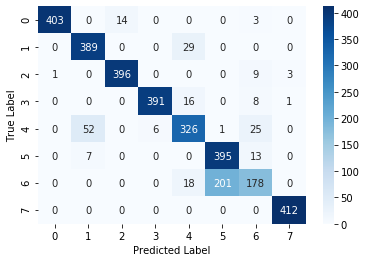

In [9]:
sns.heatmap(confusion_matrix(y_test[0], y_pred), annot=True, fmt='d', cmap="Blues"); 
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

## LIME explanator -random
### Patient 1


In [24]:
columns=X_train[0].columns.values.tolist()
train_numpy=X_train[0].to_numpy()
test_numpy=X_test[0].to_numpy()
type(train_numpy)

numpy.ndarray

In [25]:
classes=(np.unique(y_train[0]))
print(type(classes))

<class 'numpy.ndarray'>


In [26]:
import lime
import lime.lime_tabular

In [76]:
explainer = lime.lime_tabular.LimeTabularExplainer(train_numpy, feature_names=columns,class_names=classes, discretize_continuous=True)

In [77]:
i = np.random.randint(0, X_test[0].shape[0])
exp = explainer.explain_instance(test_numpy[i], best_randomforest_model.predict_proba, num_features=20, top_labels=1)
print("predicted probabilities:", best_randomforest_model.predict_proba(test_numpy[i].reshape(1,-1)))
print("real label:", test_labels_numpy[i])

predicted probabilities: [[2.14802110e-02 7.14775151e-02 3.28947368e-05 3.23366816e-03
  8.92151552e-01 1.11302980e-03 0.00000000e+00 1.05111292e-02]]
real label: 5


In [78]:
exp.show_in_notebook(show_table=True, show_all=False)

## SVM
### patient 1

subject 1 accuracy: 93.7822262663027


Text(0.5, 15.0, 'Predicted Label')

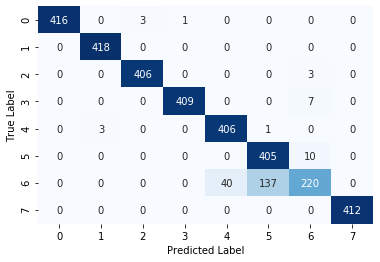

In [30]:
svm_model = SVC(kernel='linear',C=1, class_weight="balanced",gamma = 'auto', probability=True)
svm_model.fit(X_train[0], y_train[0])
y_pred = svm_model.predict(X_test[0])
    
    # save the model to disk
#     filename = 'SVM_'+f_name+'_s'+str(s+1)+'.sav'
#     pickle.dump(model, open(filename, 'wb'))
    
SVM_acc = metrics.accuracy_score(y_test[0], y_pred)
print("subject 1 accuracy:",SVM_acc*100)
sns.heatmap(confusion_matrix(y_test[0], y_pred), annot=True, fmt='d', cmap="Blues", cbar=False);
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

In [79]:
i = np.random.randint(0, X_test[0].shape[0])
exp = explainer.explain_instance(test_numpy[i], svm_model.predict_proba, num_features=20, top_labels=1)
print("predicted probabilites:", svm_model.predict_proba(test_numpy[i].reshape(1,-1)))
print("real label:", test_labels_numpy[i])

predicted probabilites: [[1.55832890e-12 9.99998954e-01 1.94658681e-08 9.07615815e-08
  9.94603397e-08 4.32525924e-08 5.24440041e-08 7.40128683e-07]]
real label: 2


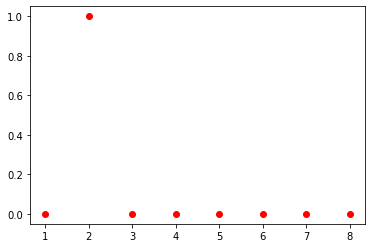

In [84]:
plt.plot(classes, (svm_model.predict_proba(test_numpy[i].reshape(1,-1)))[0,:],  'ro')

In [80]:
exp.show_in_notebook(show_table=True, show_all=False)

## KNN
### Patient 1

subject 1 accuracy:  96.54231119199272


Text(0.5, 15.0, 'Predicted Label')

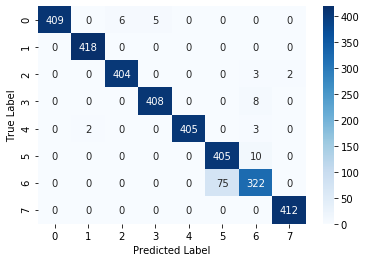

In [34]:
knn_model = KNeighborsClassifier(n_neighbors=40)#,weights='distance')
knn_model.fit(X_train[0],y_train[0])
y_pred = knn_model.predict(X_test[0])
knn_acc=metrics.accuracy_score(y_test[0], y_pred)
print("subject 1 accuracy: ", knn_acc*100)
sns.heatmap(confusion_matrix(y_test[0], y_pred), annot=True, fmt='d', cmap="Blues"); 
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

## NAIVE BAYES
### Patient 1

subject 1 accuracy:  92.53867151956324


Text(0.5, 15.0, 'Predicted Label')

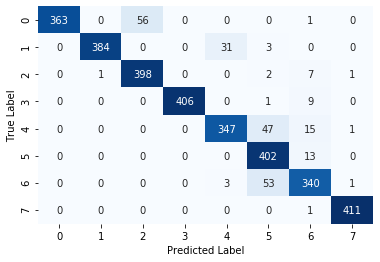

In [35]:
NaiveBayes_model = GaussianNB(var_smoothing=0.1)

NaiveBayes_model.fit(X_train[0], y_train[0])
y_pred=NaiveBayes_model.predict(X_test[0])
NB_acc= metrics.accuracy_score(y_test[0], y_pred)
print("subject 1 accuracy: ", NB_acc*100)
sns.heatmap(confusion_matrix(y_test[0], y_pred), annot=True, fmt='d', cmap="Blues", cbar=False);
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

## LDA
### Patient 1

subject 1 accuracy:  96.08735213830755


Text(0.5, 15.0, 'Predicted Label')

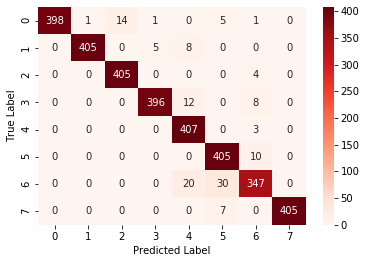

In [36]:
LDA_model = LinearDiscriminantAnalysis(solver='svd')
LDA_model.fit(X_train[0], y_train[0])
    
#     # save the model to disk
#     filename = 'LDA_'+f_name+'_s'+str(s+1)+'.sav'
#     pickle.dump(LDA, open(filename, 'wb'))
y_pred = LDA_model.predict(X_test[0])
LDA_acc = metrics.accuracy_score(y_test[0], y_pred)
print("subject 1 accuracy: ", LDA_acc*100)
sns.heatmap(confusion_matrix(y_test[0], y_pred), annot=True, fmt='d', cmap="Reds");
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

# Compare features in different models

### patient 1 

example 10: both 8

example 100= random forest 2 36% 5 32%, svm 5 75% 2 10%

In [70]:
patient=0
train_numpy=X_train[patient].to_numpy()
test_numpy=X_test[patient].to_numpy()
test_labels_numpy=y_test[patient].to_numpy()

type(train_numpy)
explainer = lime.lime_tabular.LimeTabularExplainer(train_numpy, feature_names=columns,class_names=classes, discretize_continuous=True)
instance=200

### RANDOM FOREST

In [71]:
exp = explainer.explain_instance(test_numpy[instance], best_randomforest_model.predict_proba, num_features=20, top_labels=1)
best_randomforest_model.predict_proba(test_numpy[instance].reshape(1,-1))
print("predicted probabilities:", best_randomforest_model.predict_proba(test_numpy[instance].reshape(1,-1)))
print("real label:", test_labels_numpy[instance])
exp.show_in_notebook(show_table=True, show_all=False)

[[1.35816527e-02 1.37819644e-01 2.96042974e-03 6.82462885e-01
  9.74512267e-02 5.90506544e-03 2.53807107e-05 5.97937166e-02]]
real label: 4


### SVM

In [72]:
exp = explainer.explain_instance(test_numpy[instance], svm_model.predict_proba, num_features=20, top_labels=1)
print("predicted probabilites:", svm_model.predict_proba(test_numpy[instance].reshape(1,-1)))
print("real label:", test_labels_numpy[instance])
exp.show_in_notebook(show_table=True, show_all=False)

predicted probabilites: [[9.58428339e-14 1.83612060e-14 2.39119816e-14 9.99999878e-01
  1.89707931e-08 2.38117709e-08 4.73148526e-08 3.21473680e-08]]
real label: 4


### KNN

In [73]:
exp = explainer.explain_instance(test_numpy[instance], knn_model.predict_proba, num_features=20, top_labels=1)
print("predicted proabilities: ", knn_model.predict_proba(test_numpy[instance].reshape(1,-1)))
print("real label:", test_labels_numpy[instance])
exp.show_in_notebook(show_table=True, show_all=False)

predicted proabilities:  [[0. 0. 0. 1. 0. 0. 0. 0.]]
real label: 4


### NAIVE BAYES

In [74]:
exp = explainer.explain_instance(test_numpy[instance], NaiveBayes_model.predict_proba, num_features=20, top_labels=1)
print("predicted probabilities: ", NaiveBayes_model.predict_proba(test_numpy[instance].reshape(1,-1)))
print("real label:", test_labels_numpy[instance])
exp.show_in_notebook(show_table=True, show_all=False)

predicted probabilities:  [[2.69126770e-080 5.20625208e-131 6.36253751e-165 1.00000000e+000
  4.08510147e-152 1.03376985e-186 6.96081576e-245 8.65450069e-135]]
real label: 4


### LDA

In [75]:
exp = explainer.explain_instance(test_numpy[instance], LDA_model.predict_proba, num_features=20, top_labels=1)
print("predicted probabilities:", LDA_model.predict_proba(test_numpy[instance].reshape(1,-1)))
print("real label:", test_labels_numpy[instance])
exp.show_in_notebook(show_table=True, show_all=False)

predicted probabilities: [[1.71560182e-10 3.46201559e-16 2.49653391e-10 9.99999986e-01
  5.76548100e-11 9.43515712e-09 4.02056272e-09 2.43093203e-12]]
real label: 4


## ALL PATIENT

In [46]:
final_X_train=pd.concat(X_train)
print(final_X_train.shape)
final_y_train=pd.concat(y_train)
print(final_y_train.shape)
final_X_test=pd.concat(X_test)
print(final_X_test.shape)
final_y_test=pd.concat(y_test)
print(final_y_test.shape)

(47689, 90)
(47689,)
(35547, 90)
(35547,)


### RANDOM FOREST 

In [47]:
classifier = RandomForestClassifier()
parameters = {'criterion': ['entropy', 'gini'], 
              'max_depth': [10,15],
              'min_samples_split': [0.05, 0.1],
              'min_samples_leaf': [0.03, 0.04]}
from sklearn.model_selection import GridSearchCV
gs = GridSearchCV(classifier, parameters, cv=3, scoring = 'accuracy', verbose=50, n_jobs=-1, refit=True)
gs = gs.fit(final_X_train,final_y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   29.4s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   29.4s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:   30.3s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   30.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:   31.5s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:   33.8s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:   34.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:  1.

In [48]:
#summarize the results of your GRIDSEARCH
print('***GRIDSEARCH RESULTS***')

print("Best score: %f using %s" % (gs.best_score_, gs.best_params_))
means = gs.cv_results_['mean_test_score']
stds = gs.cv_results_['std_test_score']
params = gs.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

***GRIDSEARCH RESULTS***
Best score: 0.705256 using {'criterion': 'gini', 'max_depth': 15, 'min_samples_leaf': 0.03, 'min_samples_split': 0.05}
0.698127 (0.025675) with: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 0.03, 'min_samples_split': 0.05}
0.667889 (0.027949) with: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 0.03, 'min_samples_split': 0.1}
0.688963 (0.025302) with: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 0.04, 'min_samples_split': 0.05}
0.667910 (0.016924) with: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 0.04, 'min_samples_split': 0.1}
0.700328 (0.029876) with: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 0.03, 'min_samples_split': 0.05}
0.672481 (0.021681) with: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 0.03, 'min_samples_split': 0.1}
0.677871 (0.022488) with: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 0.04, 'min_samples_split': 0.05}
0.673698 (0.

In [49]:
#TEST ON YOUR TEST SET 
best_model = gs.best_estimator_
y_pred = best_model.predict(final_X_test)

In [53]:
print(sklearn.metrics.accuracy_score(final_y_test, best_model.predict(final_X_test)))

0.7515683461332883


Text(0.5, 15.0, 'Predicted Label')

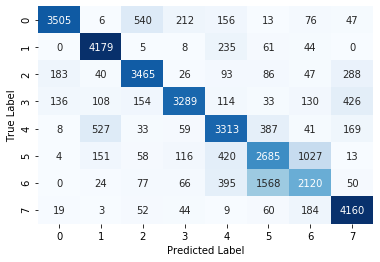

In [51]:
sns.heatmap(confusion_matrix(final_y_test, y_pred), annot=True, fmt='d', cmap="Blues", cbar=False);
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

### SVM

In [ ]:
%%time
svm_model = SVC(kernel='linear',C=1, class_weight="balanced",gamma = 'auto', probability=True)
svm_model.fit(final_X_train, final_y_train)
y_pred = svm_model.predict(final_X_test)
    
    # save the model to disk
#     filename = 'SVM_'+f_name+'_s'+str(s+1)+'.sav'
#     pickle.dump(model, open(filename, 'wb'))
    
SVM_acc = metrics.accuracy_score(final_y_test, y_pred)

subject accuracy: 86.13666413480743


Text(0.5, 15.0, 'Predicted Label')

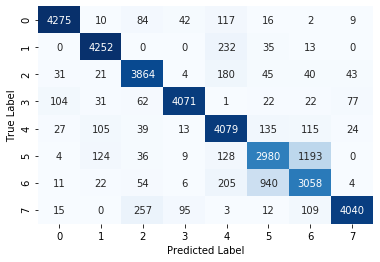

In [55]:
print("subject accuracy:",SVM_acc*100)
sns.heatmap(confusion_matrix(final_y_test, y_pred), annot=True, fmt='d', cmap="Blues", cbar=False);
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

### KNN

accuracy:  86.26607027315949
Wall time: 6min 16s


Text(0.5, 15.0, 'Predicted Label')

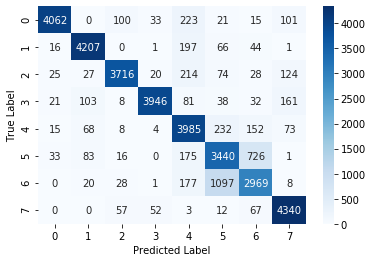

In [62]:
%%time
knn_model = KNeighborsClassifier(n_neighbors=40)#,weights='distance')
knn_model.fit(final_X_train, final_y_train)
y_pred = knn_model.predict(final_X_test)
knn_acc=metrics.accuracy_score(final_y_test, y_pred)
print("accuracy: ", knn_acc*100)
sns.heatmap(confusion_matrix(final_y_test, y_pred), annot=True, fmt='d', cmap="Blues"); 
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

### LDA

accuracy:  82.38951247643965
Wall time: 801 ms


Text(0.5, 15.0, 'Predicted Label')

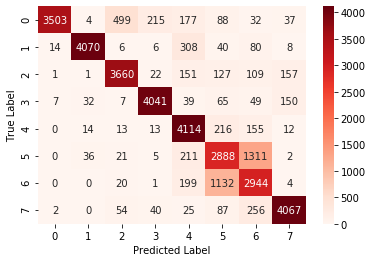

In [61]:
%%time
LDA_model = LinearDiscriminantAnalysis(solver='svd')
LDA_model.fit(final_X_train, final_y_train)
    
#     # save the model to disk
#     filename = 'LDA_'+f_name+'_s'+str(s+1)+'.sav'
#     pickle.dump(LDA, open(filename, 'wb'))
y_pred = LDA_model.predict(final_X_test)
LDA_acc = metrics.accuracy_score(final_y_test, y_pred)
print("accuracy: ", LDA_acc*100)
sns.heatmap(confusion_matrix(final_y_test, y_pred), annot=True, fmt='d', cmap="Reds");
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

# SHAP

In [10]:
shap.initjs()

In [11]:
X_train[0]

,MAV1,MAV2,MAV3,MAV4,MAV5,MAV6,MAV7,MAV8,MAV9,MAV10,...,IEMG1,IEMG2,IEMG3,IEMG4,IEMG5,IEMG6,IEMG7,IEMG8,IEMG9,IEMG10
1206,-0.570692,-0.597231,-0.831528,-0.611149,-0.826645,-0.972647,-1.064437,-0.500616,-0.567811,-0.885467,...,-0.570681,-0.597232,-0.831523,-0.611158,-0.826623,-0.972633,-1.064439,-0.500585,-0.567804,-0.885463
38,-0.216615,-0.525851,-0.554206,-1.005467,-0.388393,-0.690013,0.119944,-1.152194,-0.875655,-0.495396,...,-0.216564,-0.525851,-0.554205,-1.005461,-0.388396,-0.690009,0.119962,-1.152195,-0.875647,-0.495396
968,2.769745,0.045510,1.081260,1.074429,1.998102,0.520184,0.872620,-0.233070,2.218844,1.840436,...,2.769778,0.045501,1.081201,1.074446,1.998015,0.520199,0.872675,-0.233042,2.218941,1.840389
2348,0.894099,-0.564951,-0.332150,-0.165265,0.143192,-0.481903,-0.270114,-1.110642,0.143458,0.749962,...,0.894128,-0.564949,-0.332120,-0.165274,0.143186,-0.481919,-0.270086,-1.110620,0.143447,0.749995
727,-0.070833,4.078743,5.670723,0.212495,0.398301,0.713746,0.934282,1.023056,0.753204,-0.053715,...,-0.070866,4.078888,5.670769,0.212507,0.398301,0.713758,0.934267,1.023043,0.753165,-0.053704
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
705,-0.265668,3.441451,1.333161,0.038887,0.126531,0.524246,0.628146,0.508514,0.445278,-0.227910,...,-0.265716,3.441401,1.333265,0.038878,0.126526,0.524247,0.628184,0.508559,0.445257,-0.227931
3383,-0.492588,-0.331579,0.686469,1.130647,1.543550,0.468623,-0.819676,0.914684,0.668074,-0.575715,...,-0.492603,-0.331584,0.686441,1.130629,1.543636,0.468632,-0.819673,0.914685,0.668123,-0.575728
4080,-1.071362,-0.708472,-0.906751,-0.645005,-1.073244,-0.938660,-1.199672,-0.012794,-0.966643,-1.017025,...,-1.071367,-0.708472,-0.906754,-0.644996,-1.073251,-0.938673,-1.199665,-0.012826,-0.966644,-1.017029
1484,-0.196094,0.057583,-0.389431,0.188409,-0.818255,1.148742,0.765862,0.921501,-0.480412,0.402157,...,-0.196107,0.057595,-0.389441,0.188397,-0.818254,1.148719,0.765859,0.921488,-0.480399,0.402151


In [17]:
import shap
shap_explainer=shap.TreeExplainer(best_randomforest_model)
shap_values = shap_explainer.shap_values(X_train[0])

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


In [ ]:
#import shap
#shap_explainer=shap.TreeExplainer(best_randomforest_model, X_train[0], feature_perturbation="interventional", model_output="log_loss")
#shap_values = shap_explainer.shap_values(X_train[0] ,  y_train[0])

 33%|=======             | 11646/35184 [145:13<293:30]       

In [30]:
(shap_values[0].shape)

(4398, 90)

## SHAP FEATURES IMPORTANCE PER CLASS
The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want the global importance, we average the absolute Shapley values per feature across the data --> BARPLOT
Each point on the summary plot DOT is a Shapley value for a feature and an instance.
The position on the y-axis is determined by the feature and on the x-axis by the Shapley value.The color represents the value of the feature from low to high.
Overlapping points are jittered in y-axis direction, so we get a sense of the distribution of the Shapley values per feature.

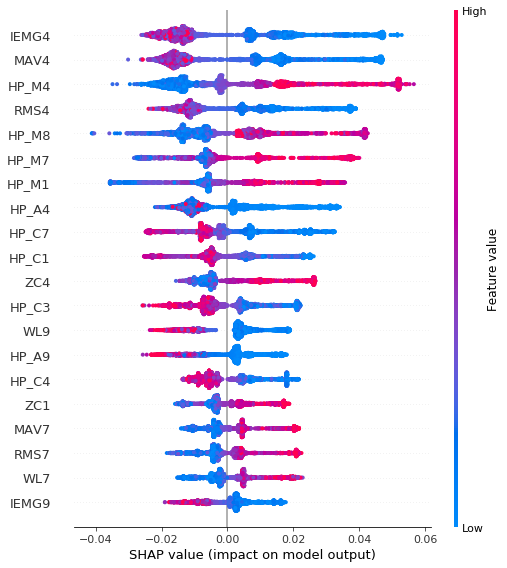

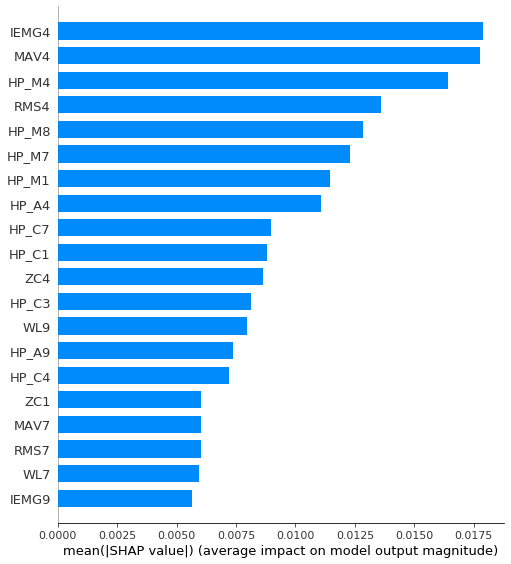

In [18]:
shap.summary_plot(shap_values[0], X_train[0], plot_type="dot", title="class 0")
shap.summary_plot(shap_values[0], X_train[0], plot_type="bar", title="class 0")


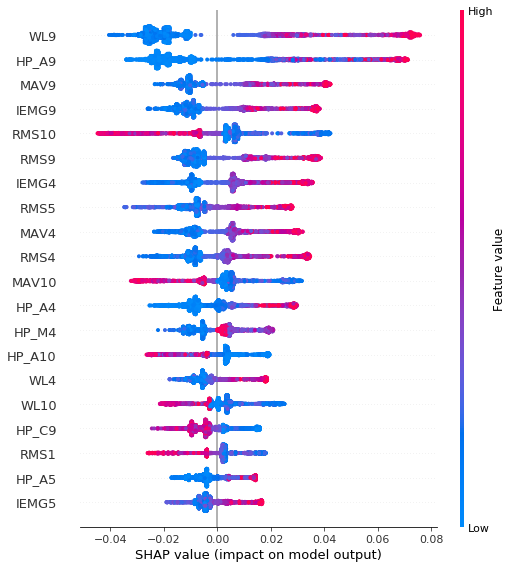

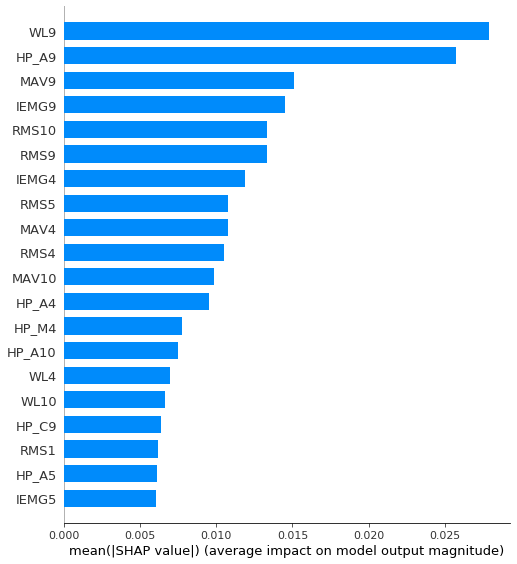

In [19]:
shap.summary_plot(shap_values[1], X_train[0], plot_type="dot", title="class 1")
shap.summary_plot(shap_values[1], X_train[0], plot_type="bar", title="class 1")

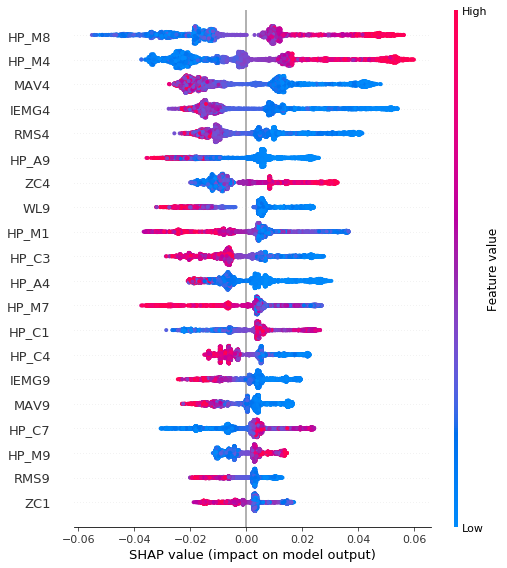

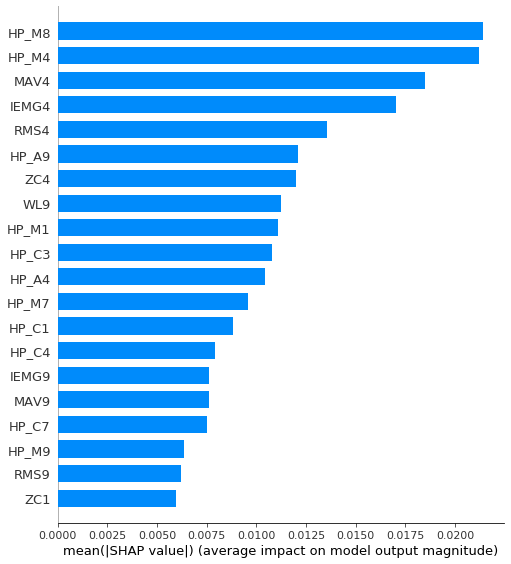

In [20]:
shap.summary_plot(shap_values[2], X_train[0], plot_type="dot")
shap.summary_plot(shap_values[2], X_train[0], plot_type="bar")

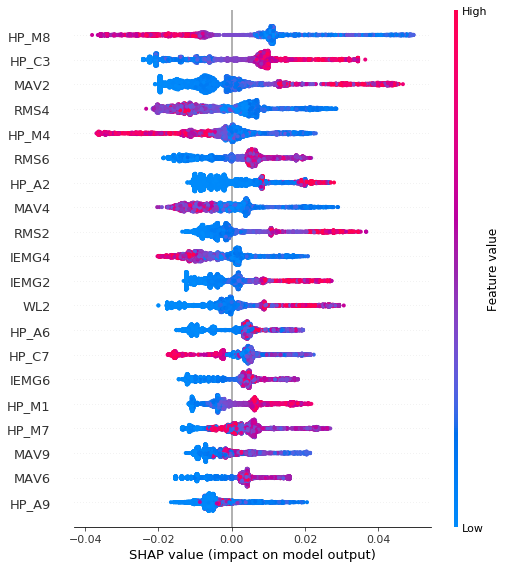

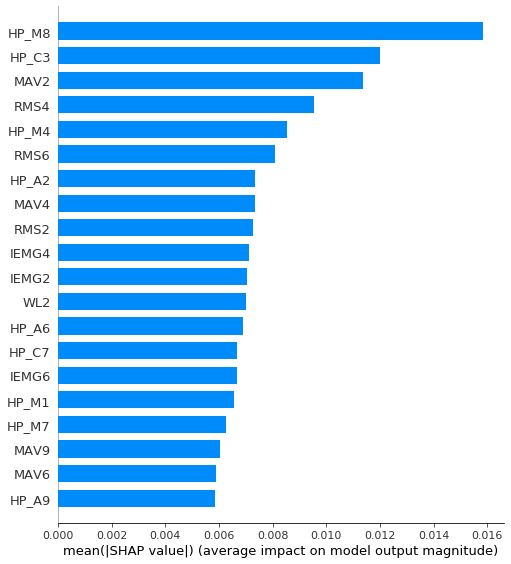

In [21]:
shap.summary_plot(shap_values[3], X_train[0], plot_type="dot")
shap.summary_plot(shap_values[3], X_train[0], plot_type="bar")

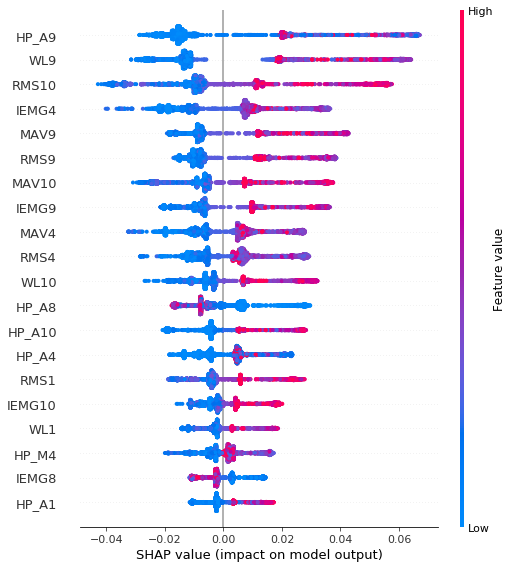

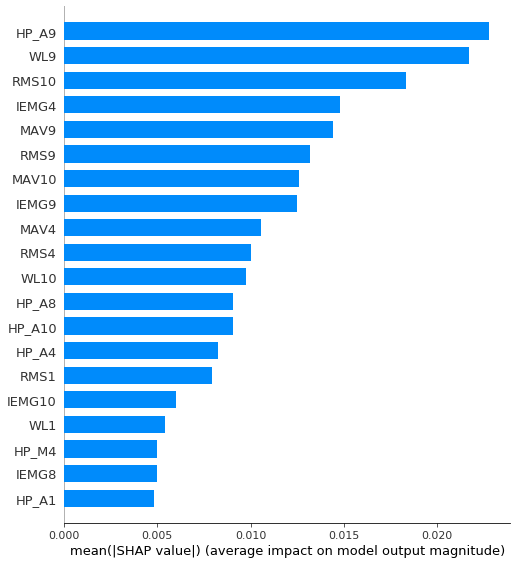

In [22]:
shap.summary_plot(shap_values[4], X_train[0], plot_type="dot")
shap.summary_plot(shap_values[4], X_train[0], plot_type="bar")

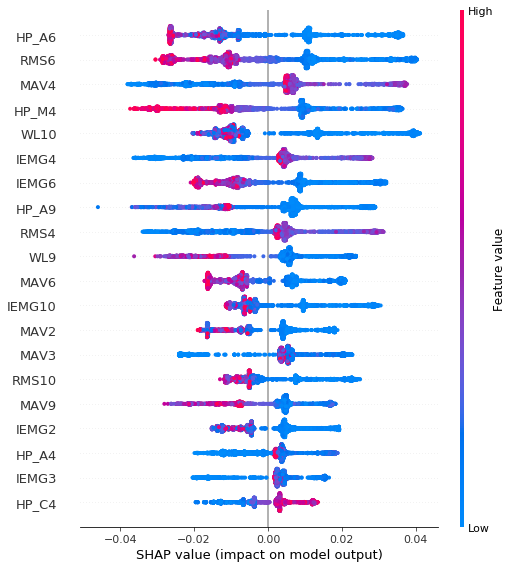

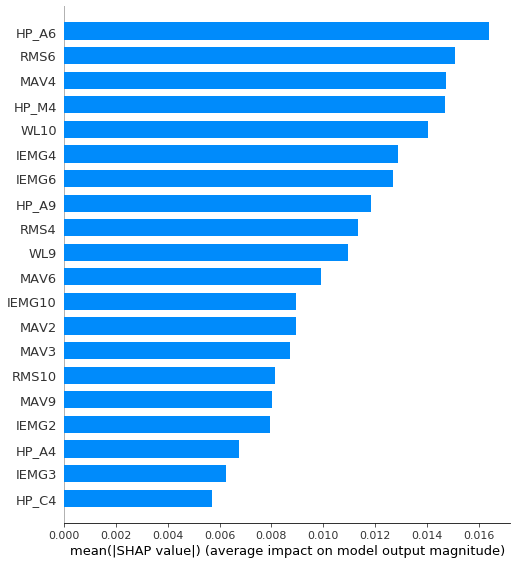

In [23]:
shap.summary_plot(shap_values[5], X_train[0], plot_type="dot")
shap.summary_plot(shap_values[5], X_train[0], plot_type="bar")

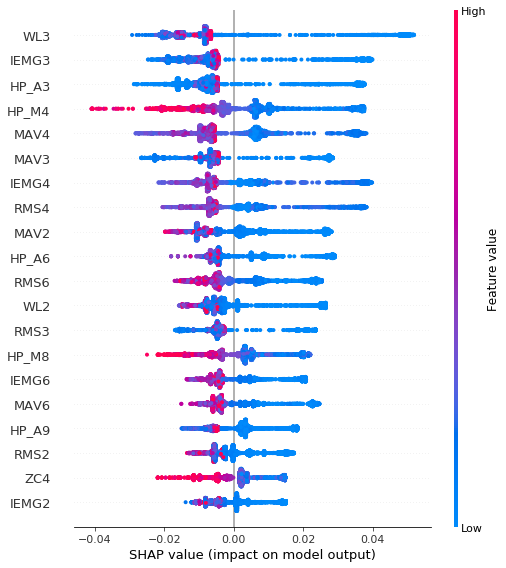

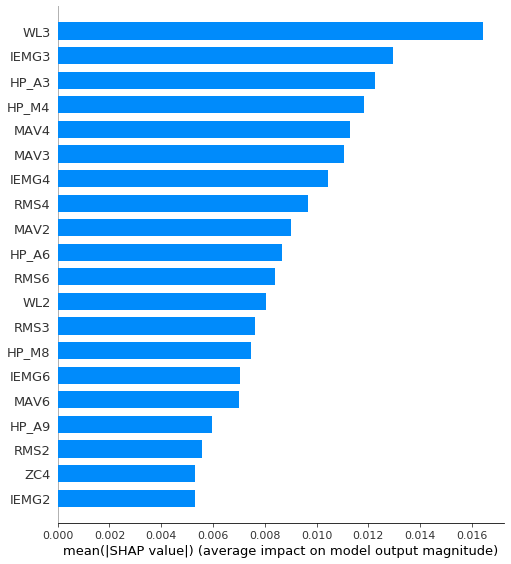

In [24]:
shap.summary_plot(shap_values[6], X_train[0], plot_type="dot")
shap.summary_plot(shap_values[6], X_train[0], plot_type="bar")

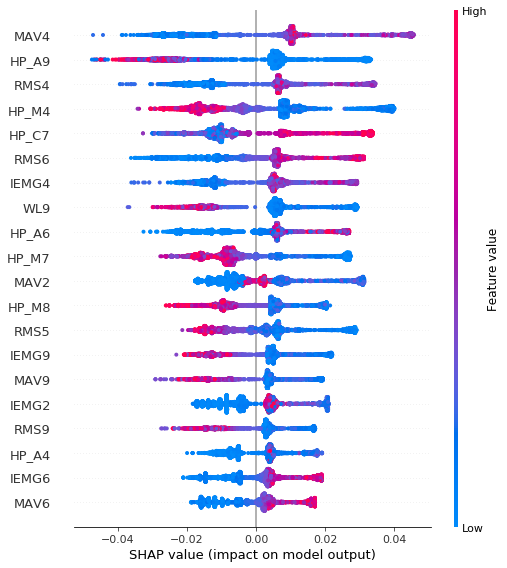

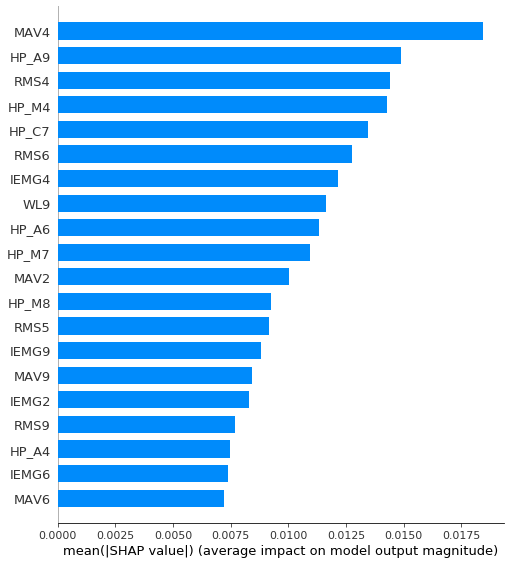

In [25]:
shap.summary_plot(shap_values[7], X_train[0], plot_type="dot")
shap.summary_plot(shap_values[7], X_train[0], plot_type="bar")

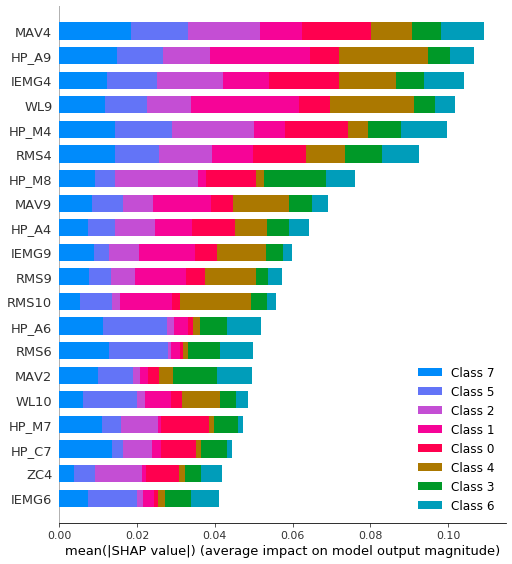

In [26]:
shap.summary_plot(shap_values, X_train[0])

In [27]:
shap.force_plot(shap_explainer.expected_value[1], shap_values[0], X_train[0])

shap.force_plot is slow for many thousands of rows, try subsampling your data.


KeyboardInterrupt: 

### KERNEL explainer

In [69]:
# explain all the predictions in the test set
X=X_train[0]
print(X.shape)

(4398, 90)


In [71]:
X_T=X_test[0]
explainer = shap.KernelExplainer(best_randomforest_model.predict_proba, X.iloc[0:1000,:])

Using 1000 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [72]:
shap_values = explainer.shap_values(X_T.iloc[0:50])
shap.force_plot(explainer.expected_value[0], shap_values[0], X_T.iloc[0:50])

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

(50, 90)

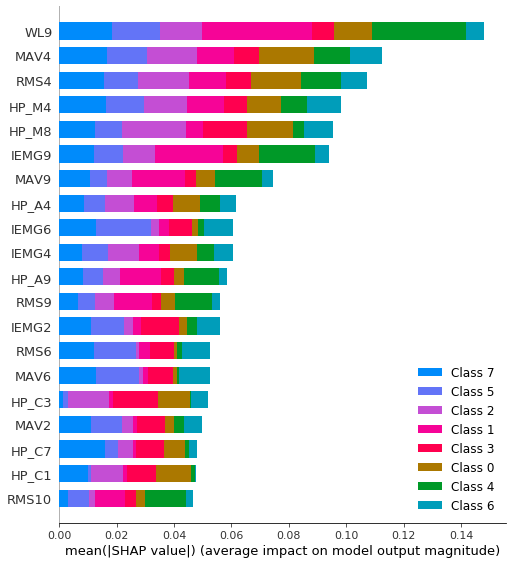

In [54]:
shap.summary_plot(shap_values, X_train[0])

In [ ]:
# # grid search for SVM
# SVC_acc=[0]*N_Subj
# classifier = SVC()
# parameters = {"kernel":['linear'], "C":[1,10,100,1000],"gamma":[1e-4]} 
# for s in range(0,N_Subj):
#     gs = GridSearchCV(classifier, parameters, cv=3, scoring = 'accuracy', verbose=50, n_jobs=-1, refit=True)
#     gs = gs.fit(X_train[s], y_train[s])
#     #summarize the results of your GRIDSEARCH
#     print('***GRIDSEARCH RESULTS***')
#     print("Best score: %f using %s" % (gs.best_score_, gs.best_params_))
#     best_model = gs.best_estimator_
#     y_pred = best_model.predict(X_test[s])
#     SVC_acc[s] = metrics.accuracy_score(y_test[s], y_pred)
#     print("subject",s+1,"accuracy",SVC_acc[s])
# print(SVC_acc[s])

In [ ]:
# print(classification_report(y_test[s], y_pred))

In [ ]:
# # grid search for NB
# NB = GaussianNB()
# l1=[0.125, 0.125,0.125,0.125,0.125, 0.125,0.125,0.125]
# parameters = {'priors':[l1,None]}

# NB_acc=[0]*N_Subj
# for s in range(0,N_Subj): 
#     gs = GridSearchCV(NB, parameters, cv=3, scoring = 'accuracy', verbose=50, n_jobs=-1, refit=True)
#     gs = gs.fit(X_train[s], y_train[s])

#     print('***GRIDSEARCH RESULTS***')
#     print("Best score: %f using %s" % (gs.best_score_, gs.best_params_))
#     best_model = gs.best_estimator_
#     y_pred = best_model.predict(X_test[s])
#     NB_acc[s] = metrics.accuracy_score(y_test[s], y_pred)
#     print("subject",s+1,"accuracy: ", NB_acc[s])
# print(NB_acc)

In [ ]:
# # grid search for LDA
# LDA = LinearDiscriminantAnalysis()
# parameters = {'solver':['svd','lsqr']}
# LDA_acc=[0]*N_Subj

# for s in range(0,N_Subj):
#     gs = GridSearchCV(LDA, parameters, cv=3, scoring = 'accuracy', verbose=50, n_jobs=-1, refit=True)
#     gs = gs.fit(X_train[s], y_train[s])

#     print('***GRIDSEARCH RESULTS***')
#     print("Best score: %f using %s" % (gs.best_score_, gs.best_params_))

#     best_model = gs.best_estimator_
#     y_pred = best_model.predict(X_test[s])
#     LDA_acc[s] = metrics.accuracy_score(y_test[s], y_pred)
#     print("subject",s+1,"accuracy: ", LDA_acc[s])
# print(LDA_acc)